In [3]:
# widen jupyter notebook window
from IPython.display import display, HTML
display(HTML("<style>:root { --jp-notebook-max-width: 100% !important; }</style>"))
display(HTML("<style>.container {width:100% !important; }</style>"))

%load_ext autoreload
%autoreload 2
import bnpm

from pprint import pprint
from pathlib import Path
import time

import cv2

import numpy as np
import torch
import matplotlib.pyplot as plt
from tqdm import tqdm

In [2]:
directory_videos  = '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0403/mouse_0403L'
filename_strMatch = '.*/2023.*cam4.*avi'  ## You can use regular expressions to search and match more complex strings
# filename_strMatch = 'cam4.*avi'  ## You can use regular expressions to search and match more complex strings


In [5]:
paths_videos = bnpm.path_helpers.find_paths(
    dir_outer=directory_videos,
    reMatch=filename_strMatch,  ## string to use to search for files in directory. Uses regular expressions!
    depth=5,  ## how many folders deep to search
    verbose=True,
)

display(paths_videos)

/mnt/MICROSCOPE/Gyu/BMI_data/cage_0403/mouse_0403L/20230703/camera_data/exp/cam4/cam42023-07-03T09_49_20.avi
/mnt/MICROSCOPE/Gyu/BMI_data/cage_0403/mouse_0403L/20230705/camera_data/exp/cam4/cam42023-07-05T12_45_33.avi
/mnt/MICROSCOPE/Gyu/BMI_data/cage_0403/mouse_0403L/20230706/camera_data/exp/cam4/cam42023-07-06T11_48_27.avi
/mnt/MICROSCOPE/Gyu/BMI_data/cage_0403/mouse_0403L/20230707/camera_data/exp/cam4/cam42023-07-07T10_15_25.avi
/mnt/MICROSCOPE/Gyu/BMI_data/cage_0403/mouse_0403L/20230708/camera_data/exp/cam4/cam42023-07-08T10_28_34.avi
/mnt/MICROSCOPE/Gyu/BMI_data/cage_0403/mouse_0403L/20230709/camera_data/exp/cam4/cam42023-07-09T10_22_38.avi
/mnt/MICROSCOPE/Gyu/BMI_data/cage_0403/mouse_0403L/20230710/camera_data/exp/cam4/cam42023-07-10T10_46_20.avi
/mnt/MICROSCOPE/Gyu/BMI_data/cage_0403/mouse_0403L/20230711/camera_data/exp/cam4/cam42023-07-11T10_48_34.avi
/mnt/MICROSCOPE/Gyu/BMI_data/cage_0403/mouse_0403L/20230712/camera_data/exp/cam4/cam42023-07-12T10_29_25.avi
/mnt/MICROSCOPE/Gyu

['/mnt/MICROSCOPE/Gyu/BMI_data/cage_0403/mouse_0403L/20230703/camera_data/exp/cam4/cam42023-07-03T09_49_20.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0403/mouse_0403L/20230705/camera_data/exp/cam4/cam42023-07-05T12_45_33.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0403/mouse_0403L/20230706/camera_data/exp/cam4/cam42023-07-06T11_48_27.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0403/mouse_0403L/20230707/camera_data/exp/cam4/cam42023-07-07T10_15_25.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0403/mouse_0403L/20230708/camera_data/exp/cam4/cam42023-07-08T10_28_34.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0403/mouse_0403L/20230709/camera_data/exp/cam4/cam42023-07-09T10_22_38.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0403/mouse_0403L/20230710/camera_data/exp/cam4/cam42023-07-10T10_46_20.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0403/mouse_0403L/20230711/camera_data/exp/cam4/cam42023-07-11T10_48_34.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0403/mouse_0403L/20230712/camera_data/exp/cam4/cam42023-07-1

In [6]:
paths_videos = [
    '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322N/20230430/camera_data/exp/cam4/cam42023-04-30T13_04_58.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322N/20230501/camera_data/exp/cam4/cam42023-05-01T10_48_48.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322N/20230502/camera_data/exp/cam4/cam42023-05-02T12_33_29.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322N/20230503/camera_data/exp/cam4/cam42023-05-03T11_32_40.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322N/20230504/camera_data/exp/cam4/cam42023-05-04T14_13_25.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322N/20230505/camera_data/exp/cam4/cam42023-05-05T10_30_17.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322N/20230506/camera_data/exp/cam4/cam42023-05-06T13_44_33.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322N/20230507/camera_data/exp/cam4/cam42023-05-07T12_01_17.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322N/20230508/camera_data/exp/cam4/cam42023-05-08T13_54_51.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322N/20230509/camera_data/exp/cam4/cam42023-05-09T11_45_27.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322N/20230510/camera_data/exp/cam4/cam42023-05-10T13_12_03.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322N/20230511/camera_data/exp/cam4/cam42023-05-11T11_30_02.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322N/20230512/camera_data/exp/cam4/cam42023-05-12T13_20_02.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322N/20230514/camera_data/exp/cam4/cam42023-05-14T13_34_13.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322N/20230515/camera_data/exp/cam4/cam42023-05-15T11_32_19.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322N/20230516/camera_data/exp/cam4/cam42023-05-16T12_41_11.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322N/20230517/camera_data/exp/cam4/cam42023-05-17T13_16_31.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322N/20230518/camera_data/exp/cam4/cam42023-05-18T11_22_53.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322N/20230519/camera_data/exp/cam4/cam42023-05-19T12_46_02.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322N/20230520/camera_data/exp/cam4/cam42023-05-20T13_28_51.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322N/20230521/camera_data/exp/cam4/cam42023-05-21T13_16_22.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322N/20230522/camera_data/exp/cam4/cam42023-05-22T12_52_31.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322N/20230523/camera_data/exp/cam4/cam42023-05-23T12_42_31.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322N/20230524/camera_data/exp/cam4/cam42023-05-24T12_40_22.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322N/20230525/camera_data/exp/cam4/cam42023-05-25T13_38_35.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322N/20230526/camera_data/exp/cam4/cam42023-05-26T12_57_18.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322N/20230527/camera_data/exp/cam4/cam42023-05-27T12_10_11.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322N/20230528/camera_data/exp/cam4/cam42023-05-28T09_46_31.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322N/20230529/camera_data/exp/cam4/cam42023-05-29T11_44_45.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322N/20230530/camera_data/exp/cam4/cam42023-05-30T13_06_25.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322N/20230531/camera_data/exp/cam4/cam42023-05-31T12_59_07.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322N/20230601/camera_data/exp/cam4/cam42023-06-01T13_31_14.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230419/camera_data/exp/cam4/cam42023-04-19T15_19_37.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230420/camera_data/exp/cam4/cam42023-04-20T13_51_20.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230424/camera_data/exp/cam4/cam42023-04-24T16_48_58.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230425/camera_data/exp/cam4/cam42023-04-25T11_06_59.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230426/camera_data/exp/cam4/cam42023-04-26T16_00_22.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230427/camera_data/exp/cam4/cam42023-04-27T11_29_15.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230428/camera_data/exp/cam4/cam42023-04-28T10_42_45.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230429/camera_data/exp/cam4/cam42023-04-29T10_50_13.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230430/camera_data/exp/cam4/cam42023-04-30T10_49_53.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230501/camera_data/exp/cam4/cam42023-05-01T13_10_56.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230502/camera_data/exp/cam4/cam42023-05-02T10_36_26.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230503/camera_data/exp/cam4/cam42023-05-03T13_27_58.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230504/camera_data/exp/cam4/cam42023-05-04T12_09_41.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230505/camera_data/exp/cam4/cam42023-05-05T12_29_36.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230506/camera_data/exp/cam4/cam42023-05-06T11_45_37.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230507/camera_data/exp/cam4/cam42023-05-07T13_59_55.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230508/camera_data/exp/cam4/cam42023-05-08T11_56_09.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230509/camera_data/exp/cam4/cam42023-05-09T13_45_35.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230510_badExpDay/camera_data/exp/cam4/cam42023-05-10T11_55_49.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230511/camera_data/exp/cam4/cam42023-05-11T13_24_25.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230512/camera_data/exp/cam4/cam42023-05-12T11_12_36.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230513/camera_data/exp/cam4/cam42023-05-13T13_10_24.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230514/camera_data/exp/cam4/cam42023-05-14T12_01_45.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230515/camera_data/exp/cam4/cam42023-05-15T13_15_45.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230516/camera_data/exp/cam4/cam42023-05-16T11_09_06.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230517/camera_data/exp/cam4/cam42023-05-17T11_43_30.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230518/camera_data/exp/cam4/cam42023-05-18T09_51_54.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230519/camera_data/exp/cam4/cam42023-05-19T11_17_08.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230520/camera_data/exp/cam4/cam42023-05-20T11_58_27.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230521/camera_data/exp/cam4/cam42023-05-21T11_46_08.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230522/camera_data/exp/cam4/cam42023-05-22T11_22_17.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230523/camera_data/exp/cam4/cam42023-05-23T10_56_37.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230524/camera_data/exp/cam4/cam42023-05-24T11_12_43.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230525/camera_data/exp/cam4/cam42023-05-25T12_04_08.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230526/camera_data/exp/cam4/cam42023-05-26T11_23_18.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230527/camera_data/exp/cam4/cam42023-05-27T10_41_24.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230530/camera_data/exp/cam4/cam42023-05-30T11_36_51.avi',
 '/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322R/20230531/camera_data/exp/cam4/cam42023-05-31T11_30_01.avi'
]

In [6]:
import warnings
from tqdm import tqdm

def get_first_frames(paths, max_attempts=5, verbose=True):
    if isinstance(paths, list) == False:
        paths = [paths]

    def get_first_frame(path, attempt=0):
        frame = cv2.VideoCapture(path).read()[1]
        if frame is None:
            print(f"Received `None` for path: {path}. Attempting again; attempt number: {attempt}")
            if attempt + 1 > max_attempts:
                warnings.warn(f"Failed to get first frame for path:{path}")
                return None
            frame = get_first_frame(path, attempt=attempt+1)
        return frame

    flag_singleOutput = len(paths) == 1
    out = [get_first_frame(path) for path in tqdm(paths, disable=flag_singleOutput)]
    out = out[0] if flag_singleOutput else out
    
    return out
        

In [7]:
images = {path: get_first_frames(path) for path in tqdm(paths_videos[:])}

100%|███████████████████████████████████████████| 38/38 [05:30<00:00,  8.70s/it]


In [10]:
bnpm.file_helpers.pickle_save(
    obj=images,
    filepath=r'/media/rich/bigSSD/analysis_data/face_rhythm/mouse_0403L/eye_laser_trace_extraction/images.pkl',
    mkdir=True,
)

In [18]:
# widen jupyter notebook window
from IPython.display import display, HTML
display(HTML("<style>:root { --jp-notebook-max-width: 100% !important; }</style>"))
display(HTML("<style>.container {width:100% !important; }</style>"))

%load_ext autoreload
%autoreload 2
import bnpm

from pprint import pprint
from pathlib import Path
import time

import cv2

import numpy as np
import torch
import matplotlib.pyplot as plt
from tqdm import tqdm

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [19]:
images = bnpm.file_helpers.pickle_load(filepath='/media/rich/bigSSD/analysis_data/face_rhythm/mouse_0403L/eye_laser_trace_extraction/images.pkl')

In [20]:
import matplotlib as mpl

Button(description='Confirm ROI', style=ButtonStyle())

Button(description='New ROI', style=ButtonStyle())

Button(description='Confirm ROI', style=ButtonStyle())

Button(description='New ROI', style=ButtonStyle())

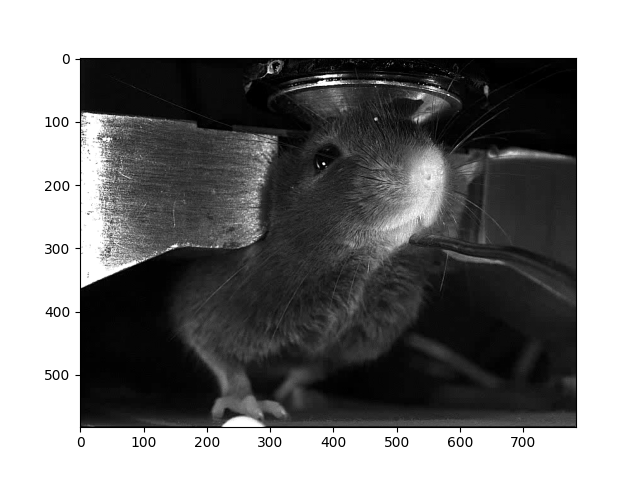

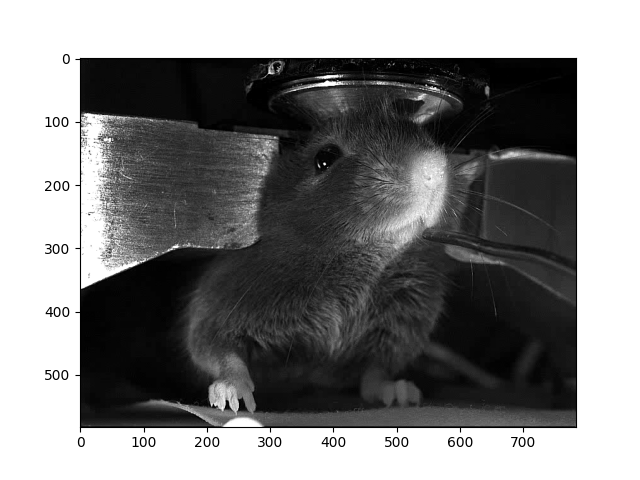

In [36]:
# %matplotlib widget
# rois = {p: bnpm.plotting_helpers.Select_ROI(images[p]) for p in paths_videos[:2]}

# rois = {}
for p in list(images.keys())[36:]:
#     print(p)
    rois[p] = bnpm.plotting_helpers.Select_ROI(images[p], backend='module://ipympl.backend_nbagg')
#     gca = plt.gca()
#     gca.set_title(p[40:])
    
    time.sleep(0.5)
    

In [37]:
masks = {path: roi.mask_frames[0] for path, roi in rois.items()}

In [38]:
bnpm.file_helpers.pickle_save(
    obj={
        'masks': masks,
        'images': images,
    },
    filepath=r'/media/rich/bigSSD/analysis_data/face_rhythm/mouse_0403L/eye_masks.pkl',
)

In [39]:
masks = bnpm.file_helpers.pickle_load(filepath=r'/media/rich/bigSSD/analysis_data/face_rhythm/mouse_0403L/eye_masks.pkl')['masks']

In [40]:
folders_masks = {(Path(p).parent.parent.parent.parent.parent.name, Path(p).parent.parent.parent.parent.name, Path(p).stem): mask for p, mask in masks.items()}

In [41]:
dir_save = r'/media/rich/bigSSD/analysis_data/face_rhythm/mouse_0403L/masks'

In [42]:
for (m,d,n), mask in folders_masks.items():
    path_save = str(Path(dir_save) / m / d / ('mask_'+n))
    Path(path_save).parent.mkdir(parents=True, exist_ok=True)
    np.save(path_save, mask)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

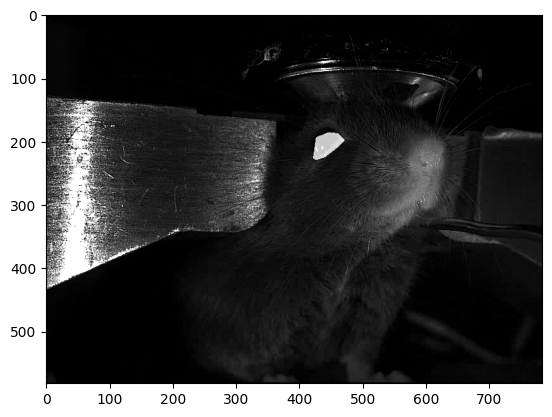

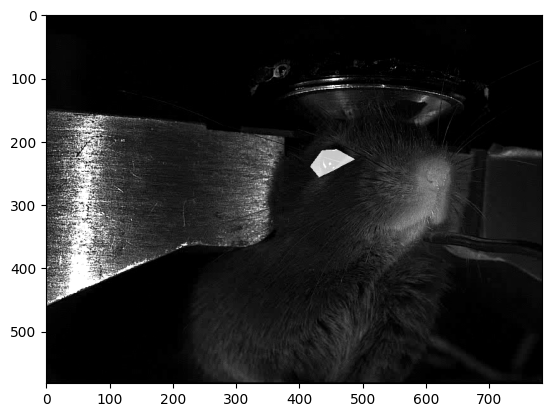

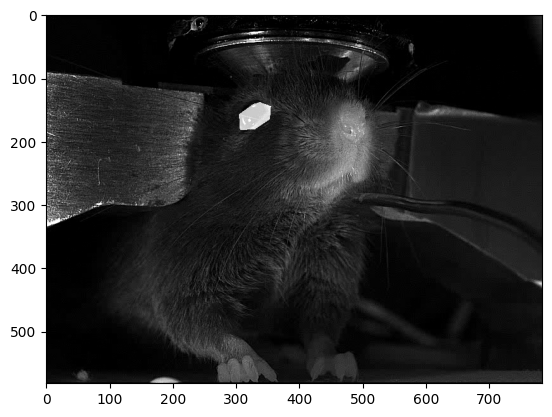

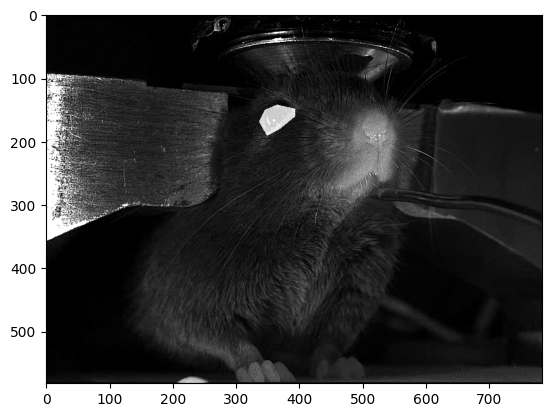

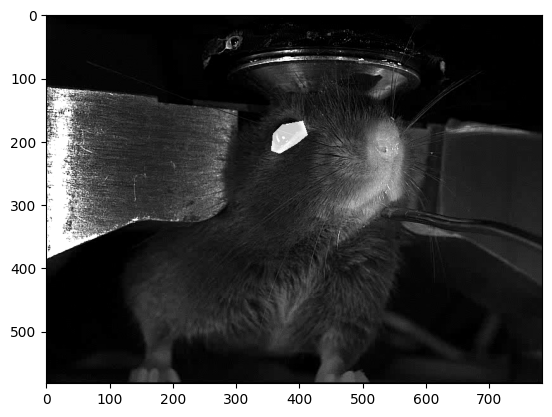

...

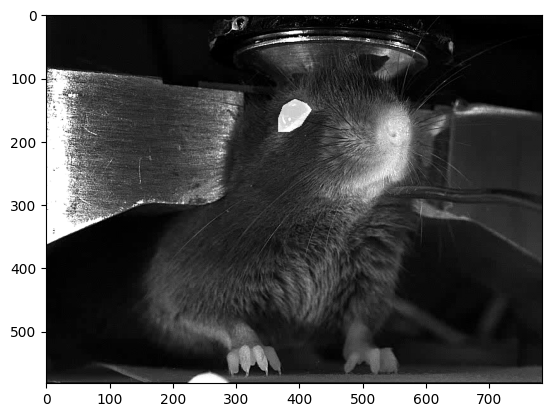

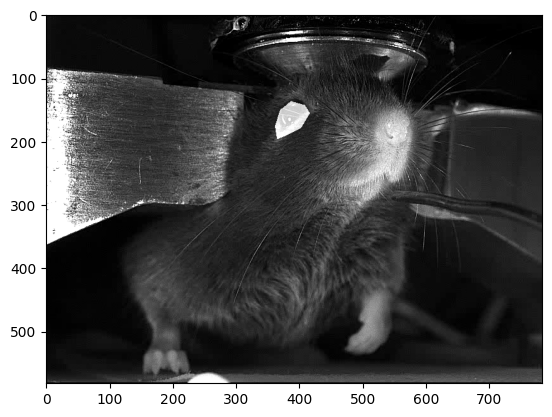

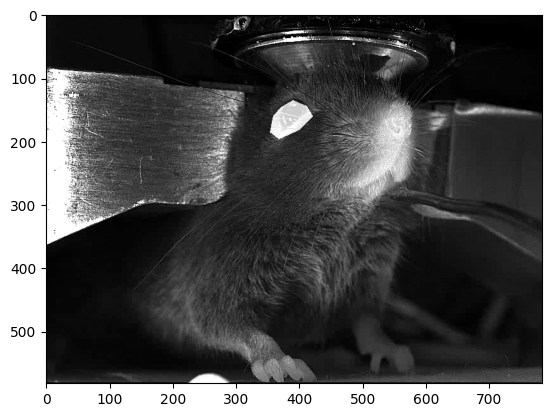

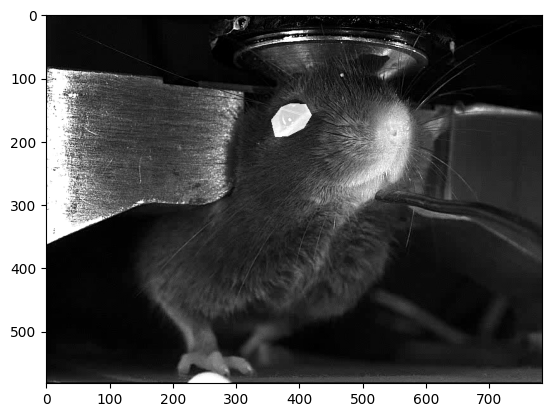

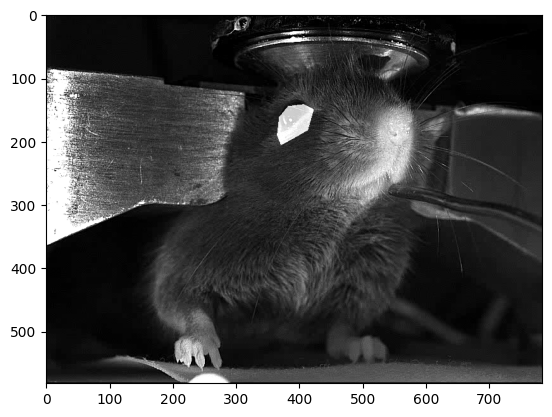

In [44]:
%matplotlib inline

for path, im in images.items():
    plt.figure()
    plt.imshow(im + masks[path][...,None]*200)
#     break

/tmp/ipykernel_2241690/261185115.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


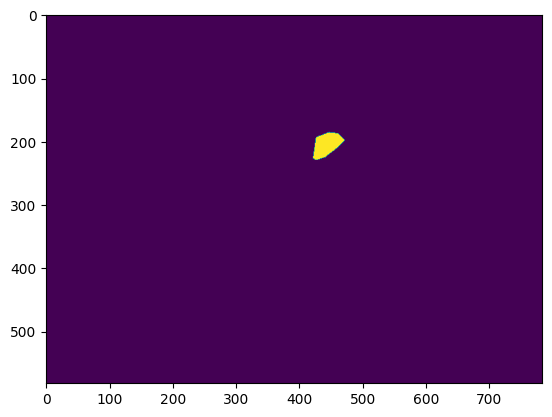

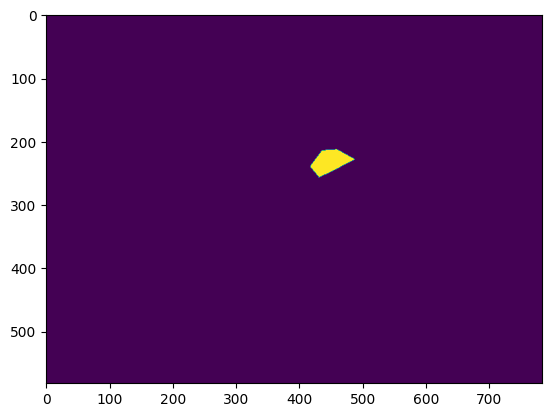

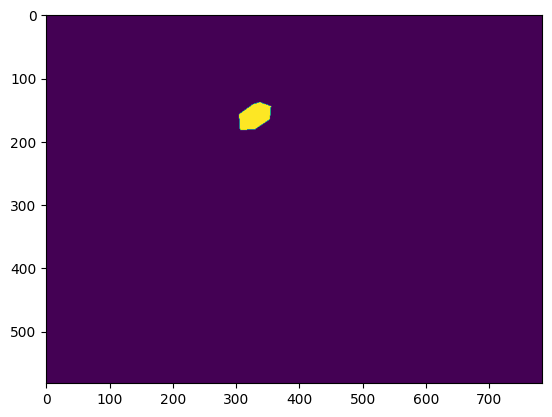

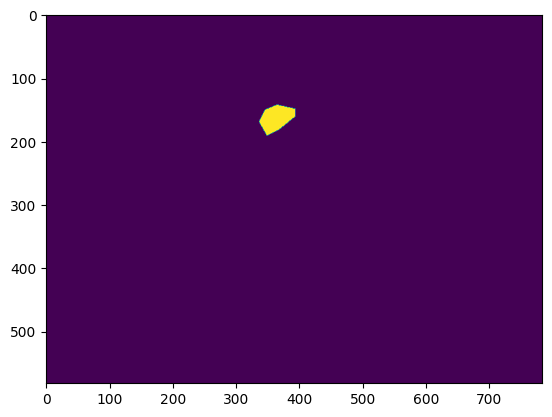

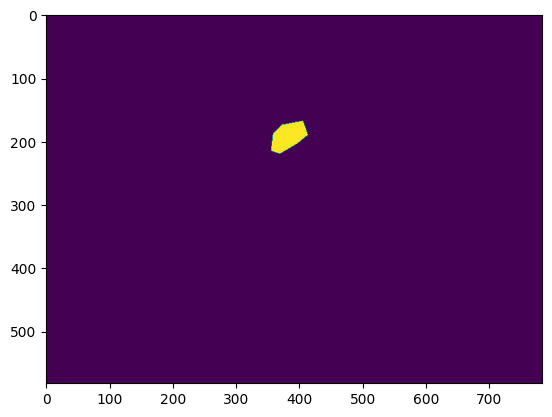

...

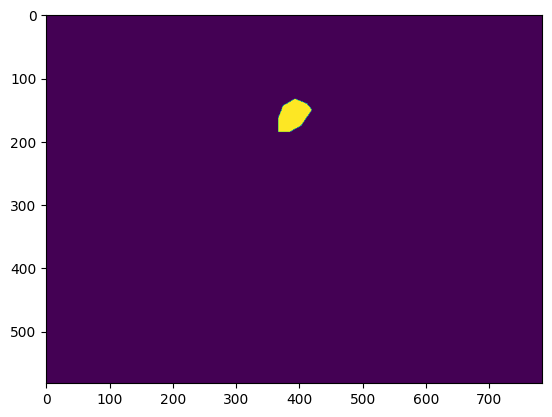

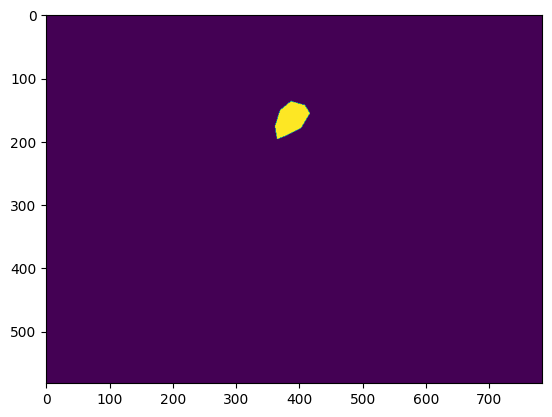

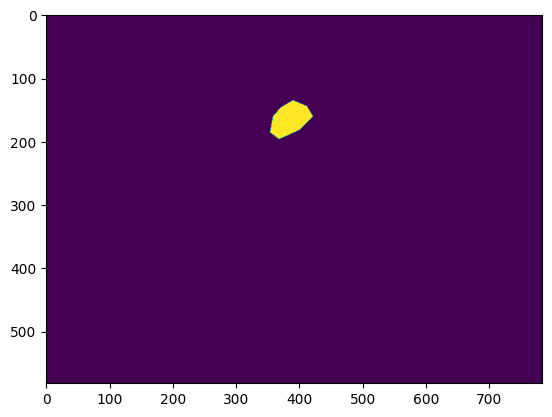

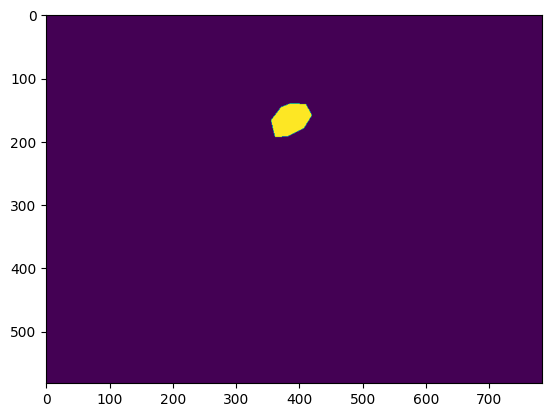

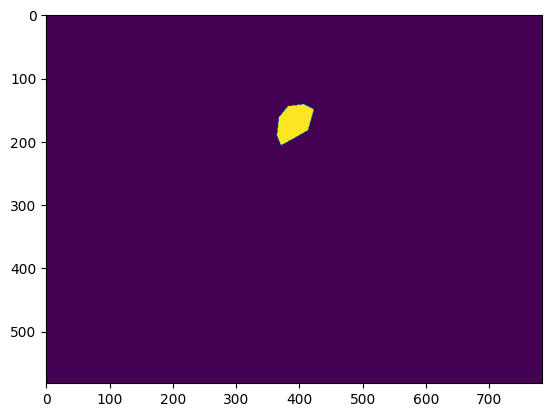

In [45]:
%matplotlib inline

for date, roi in rois.items():
    plt.figure()
    plt.imshow(roi.mask_frames[0])

In [34]:
test = bnpm.file_helpers.matlab_load(
    filepath=r'/media/rich/bigSSD/other_lab_data/Musall_data/from_20230524/20230524_151723/Vc.mat',
)

In [33]:
test.keys()

dict_keys(['frameInfo', 'trialOff', 'trialOn', 'trigOff', 'trigOn'])

In [35]:
test.keys()

dict_keys(['Sv', 'T', 'U', 'Vc', 'blueEvents', 'frameCnt', 'frameInfo', 'hemoEvents', 'hemoVar', 'ledInfo', 'opts', 'regC', 'trigOff', 'trigOn'])

In [37]:
test['trigOn'][:,1]

array([   184.,    553.,    962.,   1368.,   1725.,   1962.,   2214.,
         2547.,   2773.,   2993.,   3372.,   3773.,   4292.,   4523.,
         4778.,   5016.,   5256.,   5547.,   5801.,   6027.,   6253.,
         6483.,   6742.,   7101.,   7382.,   7601.,   7838.,   8168.,
         8495.,   8784.,   9004.,   9250.,   9639.,   9889.,  10154.,
        10465.,  10695.,  10950.,  11261.,  11492.,  11716.,  12032.,
        12334.,  12554.,  12778.,  13004.,  13374.,  13682.,  13928.,
        14152.,  14383.,  14671.,  14926.,  15198.,  15538.,  15787.,
        16032.,  16296.,  16670.,  16945.,  17302.,  17571.,  17919.,
        18177.,  18516.,  18758.,  18993.,  19218.,  19450.,  19704.,
        19958.,  20241.,  20517.,  20786.,  21157.,  21405.,  21636.,
        21864.,  22198.,  22430.,  22692.,  23030.,  23281.,  23557.,
        23862.,  24149.,  24578.,  24894.,  25133.,  25413.,  25702.,
        25935.,  26168.,  26453.,  26681.,  26998.,  27233.,  27478.,
        27778.,  281

# Below is for example trace extraction. Best to use the o2 scripts

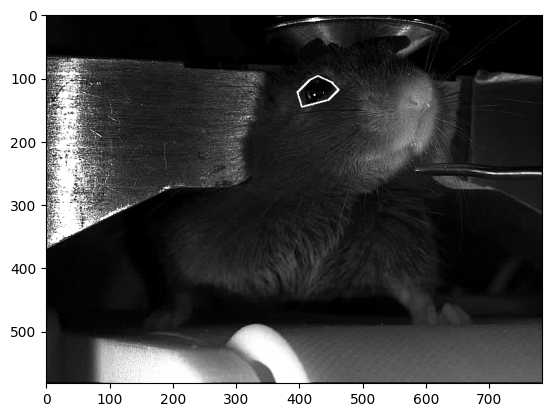

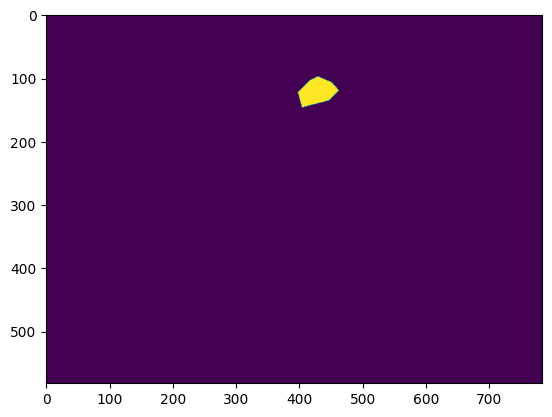

In [8]:
%matplotlib inline
plt.figure()
plt.imshow(rois['/mnt/MICROSCOPE/Gyu/BMI_data/cage_0322/mouse_0322N/20230430/camera_data/exp/cam4/cam42023-04-30T13_04_58.avi'].mask_frames[0])

In [8]:
path_mask = r'/media/rich/bigSSD/analysis_data/face_rhythm/mouse_0322N/mask.npy'

np.save(path_mask, roi.mask_frames[0])

In [13]:
path_mask = r'/media/rich/bigSSD/analysis_data/face_rhythm/mouse_0322N/masks/20230430/mask_cam42023-04-30T13_04_58.npy'

In [14]:
path_vid = r'/media/rich/bigSSD/analysis_data/face_rhythm/mouse_0322N/cam42023-05-01T10_48_48.avi'


In [16]:
import decord

In [17]:
DEVICE = bnpm.torch_helpers.set_device(use_GPU=False)

mask = torch.as_tensor(np.load(path_mask), dtype=torch.float32).to(DEVICE)
vid = decord.VideoReader(path_vid, ctx=decord.cpu(0))

prepare_frames = lambda f: torch.as_tensor(f.asnumpy()[...,0], dtype=torch.float32).to(DEVICE)
extract_trace = lambda f: torch.einsum('fhw,hw -> f', prepare_frames(f), mask)

trace_start = torch.cat([extract_trace(v) for v in bnpm.indexing.make_batches(vid, batch_size=100, length=10000)], dim=0)

idx_fastForward = int(60*59 * vid.get_avg_fps())

trace_end = torch.cat([extract_trace(v) for v in bnpm.indexing.make_batches(vid, batch_size=100, idx_start=idx_fastForward)], dim=0)


get_diff_smooth = lambda x: np.diff(bnpm.timeSeries.simple_smooth(x, sig=4), n=1)

idx_start = np.argmax(get_diff_smooth(trace_start))

idx_end = np.argmin(get_diff_smooth(trace_end)) + idx_fastForward

device: 'cpu'


[15:16:52] /github/workspace/src/video/video_reader.cc:83: ERROR opening: /media/rich/bigSSD/analysis_data/face_rhythm/mouse_0322N/cam42023-05-01T10_48_48.avi, No such file or directory


RuntimeError: Error reading /media/rich/bigSSD/analysis_data/face_rhythm/mouse_0322N/cam42023-05-01T10_48_48.avi...

In [6]:
idx_start

1438

In [7]:
idx_end

433672

In [4]:
mask = np.load(path_mask)

In [5]:
path_vid = r'/media/rich/bigSSD/analysis_data/face_rhythm/mouse_0322N/cam42023-05-01T10_48_48.avi'

# vid = bnpm.video.BufferedVideoReader(paths_videos=[path_vid], buffer_size=1000, verbose=2)

In [13]:
vid = decord.VideoReader(path_vid, decord.cpu(0))

In [14]:
DEVICE_ein = bnpm.torch_helpers.set_device(use_GPU=False)

mask = torch.as_tensor(mask, dtype=torch.float32).to(DEVICE_ein)
trace_start = torch.cat([torch.einsum('fhw,hw -> f', torch.as_tensor(v.asnumpy()[...,0], dtype=torch.float32).to(DEVICE_ein), mask) for v in tqdm(bnpm.indexing.make_batches(vid, batch_size=100, length=10000))], dim=0)

device: 'cpu'


100it [00:16,  5.96it/s]


In [8]:
frame_endStart = int(60*59 * vid.get_avg_fps())

trace_end = torch.cat([torch.einsum('fhw,hw -> f', torch.as_tensor(v.asnumpy()[...,0], dtype=torch.float32).to(DEVICE_ein), mask) for v in tqdm(bnpm.indexing.make_batches(vid, batch_size=100, idx_start=frame_endStart))], dim=0)

101it [00:17,  5.79it/s]


In [9]:
get_peak = lambda x: np.argmax(np.diff(bnpm.timeSeries.simple_smooth(x, sig=4), n=1))

get_trough = lambda x: np.argmin(np.diff(bnpm.timeSeries.simple_smooth(x, sig=4), n=1))

idx_start = get_peak(trace_start)

idx_end = get_trough(trace_end) + frame_endStart

In [10]:
idx_start

1438

In [11]:
idx_end

433672

In [12]:
bnpm.file_helpers.pickle_save(
    obj={
        'idx_start': idx_start,
        'idx_end': idx_end,
        'path_vid': path_vid,
        'path_mask': path_mask,
    },
    filepath=r'/media/rich/bigSSD/analysis_data/face_rhythm/mouse_0322N/idx_laser.pkl',
)

In [28]:
import pandas as pd

In [30]:
csv = pd.read_csv(r'/media/rich/bigSSD/analysis_data/face_rhythm/mouse_0322N/times_cam42023-05-01T10_48_48.csv', header=None)

In [31]:
csv

,0,1,2,3,4
0,1879048192,418574653,1590732029,1590732029,2023-05-01T10:48:48.8074240
1,1879048192,418574654,1591005442,1591005442,2023-05-01T10:48:48.8136576
2,1879048192,418574655,1591277829,1591277829,2023-05-01T10:48:48.8214784
3,1879048192,418574656,1591551248,1591551248,2023-05-01T10:48:48.8298752
4,1879048192,418574657,1591824643,1591824643,2023-05-01T10:48:48.8386688
...,...,...,...,...,...
434819,1879048192,419009472,2920662623,2920662623,2023-05-01T11:49:12.3902848
434820,1879048192,419009473,2920936042,2920936042,2023-05-01T11:49:12.3982208
434821,1879048192,419009474,2921208423,2921208423,2023-05-01T11:49:12.4065280
434822,1879048192,419009475,2921481872,2921481872,2023-05-01T11:49:12.4148736


In [32]:
test = csv[4].to_numpy().astype('datetime64')

In [208]:
(test[idx_end] - test[idx_start]).astype(np.float32) / 1000000000

3602.725732352

In [33]:
(test[idx_end] - test[idx_start]).astype(np.float32) / 1000000000

3602.042847232

In [34]:
times = bnpm.indexing.moduloCounter_to_linearCounter(csv[2].to_numpy(), 2**32, plot_pref=False)

In [210]:
(times[idx_end] - times[idx_start])/2**25

3602.7726957201958

In [35]:
(times[idx_end] - times[idx_start])/2**25

3602.0818551182747

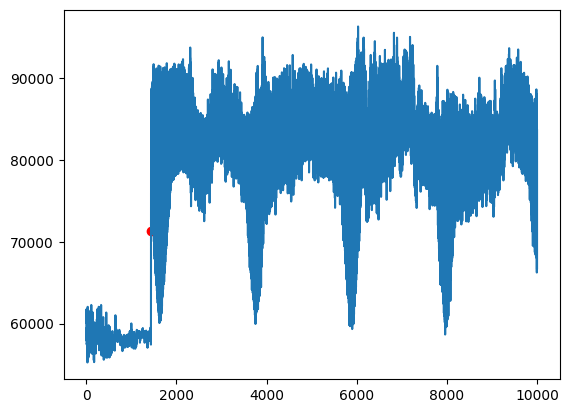

In [36]:
plt.figure()
plt.plot(trace_start)
plt.scatter(idx_start, trace_start[idx_start], c='r')

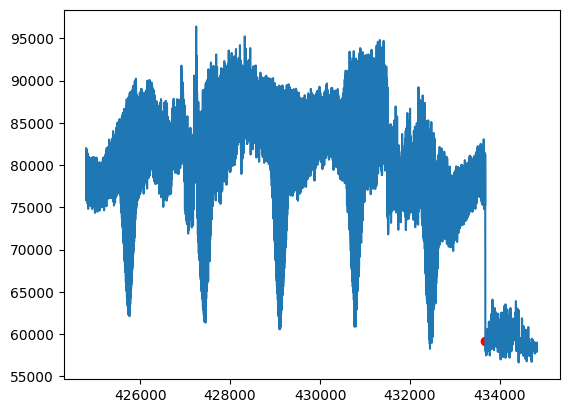

In [37]:
plt.figure()
plt.plot(np.arange(trace_end.shape[0]) + frame_endStart, trace_end)
plt.scatter(idx_end, trace_end[idx_end - frame_endStart], c='r')

In [38]:
ws = bnpm.h5_handling.simple_load(r'/media/rich/bigSSD/analysis_data/face_rhythm/mouse_0322N/wavesurfer_files/20230430/exp_0001.h5')

In [48]:
get_peak(ws['sweep_0001']['analogScans'][1][:1000])

101

In [51]:
(get_trough(ws['sweep_0001']['analogScans'][1]) - get_peak(ws['sweep_0001']['analogScans'][1]))/1000

3602.73

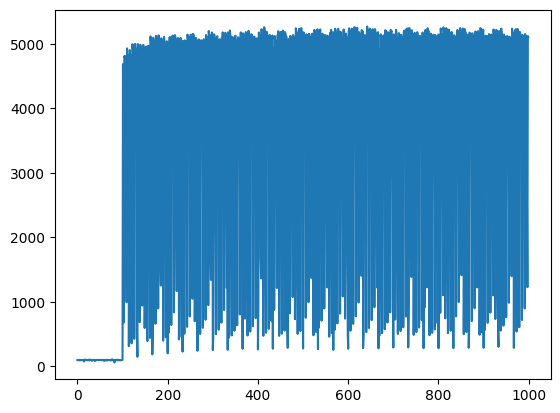

In [47]:
plt.figure()
plt.plot(ws['sweep_0001']['analogScans'][1][:1000])